In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
from PIL import Image

from fiber_predictor.svr_hog.feature_extraction import HogFeatureExtractor
from fiber_predictor.svr_hog.models import FiberPredictor
from fiber_predictor.svr_hog.data_processing import HogDataset
from sklearn.pipeline import Pipeline

In [14]:
# Define grid quotient and orientations
GRID_QUOTIENT = np.arange(1, 6)
ORIENTATIONS = 10

# Instantiate the HOG feature extractor
hog_extractor = HogFeatureExtractor(grid_quotient=GRID_QUOTIENT, orientations=ORIENTATIONS)

# Load the trained model from pickle file
with open("../trained_models/combined_model.pkl", 'rb') as f:
    model = pickle.load(f)

In [18]:
# Function to check if an image is valid (not too dark or bright)
def check_image(image):
    img = np.array(image)
    if np.mean(img) < 0.05 * 256 or np.mean(img) > 0.95 * 256:
        return False
    return True

# Function to get orientation map from a list of voxels
def get_orientation_map(voxel_list, pos_list, voxel_size):
    angle_list = []
    x = pos_list[:, 0] + voxel_size / 2
    y = pos_list[:, 1] + voxel_size / 2
    u, v = [], []
    valid_count, invalid_count = 0, 0

    # Extract HOG features for each voxel and use model to predict the orientation
    for voxel in voxel_list:
        if check_image(voxel):
            feature_vector = hog_extractor(voxel).reshape(1, -1)
            angle = model.predict(feature_vector)[0] * (np.pi / 180)
            angle_list.append(angle)
            u.append(np.cos(angle))
            v.append(np.sin(angle))
            valid_count += 1
        else:
            angle_list.append(None)
            u.append(0)
            v.append(0)
            invalid_count += 1
    return x, y, u, v, angle_list, (valid_count, invalid_count)

# Function to plot orientation map on the image
def plot_map(image, img_name, x, y, u, v, counts, color="yellow", scale=1):
    plt.figure(figsize=(8, 8))
    plt.imshow(image, cmap="gray")
    plt.quiver(x, y, u, v, color=color, pivot="middle", scale=scale)
    plt.axis("off")
    plt.title(f"Img: {img_name} | Valid voxel rate: {counts[0]} / {counts[0] + counts[1]} ", fontsize=7)

# Function to load an image
def get_img(img_path):
    return Image.open(img_path).convert('L')

# Function to slice the image into smaller voxels
def slice_image(image, voxel_size):
    width, height = image.size
    voxel_list = []
    pos_list = []

    # Iterate through the image, slicing it into voxel_size x voxel_size patches
    for y in range(0, height, voxel_size):
        for x in range(0, width, voxel_size):
            box = (x, y, x + voxel_size, y + voxel_size)
            voxel = image.crop(box)
            voxel_list.append(voxel)
            pos_list.append((x, y))
    
    pos_list = np.array(pos_list)
    return voxel_list, pos_list


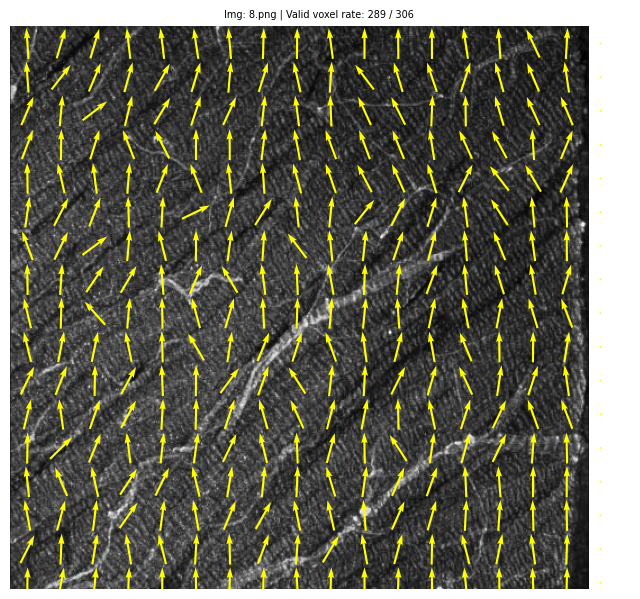

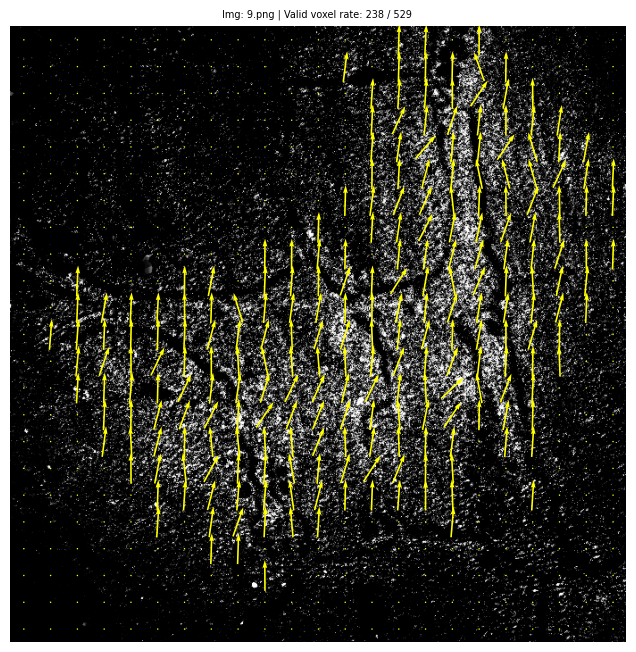

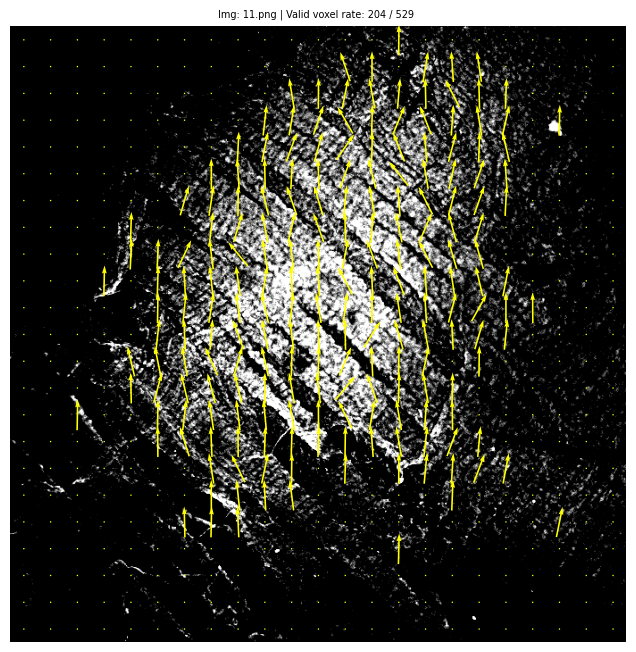

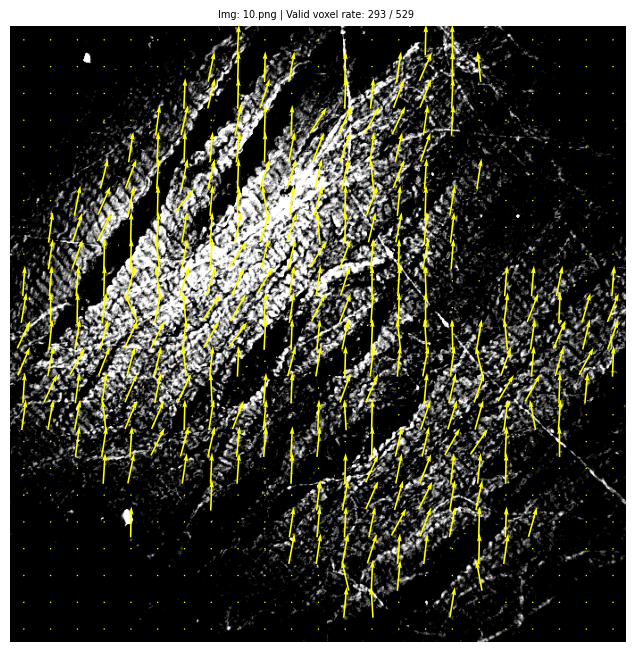

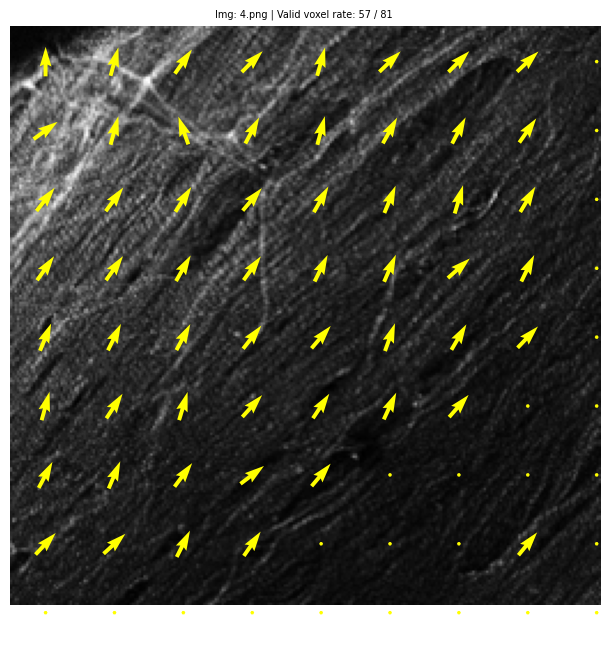

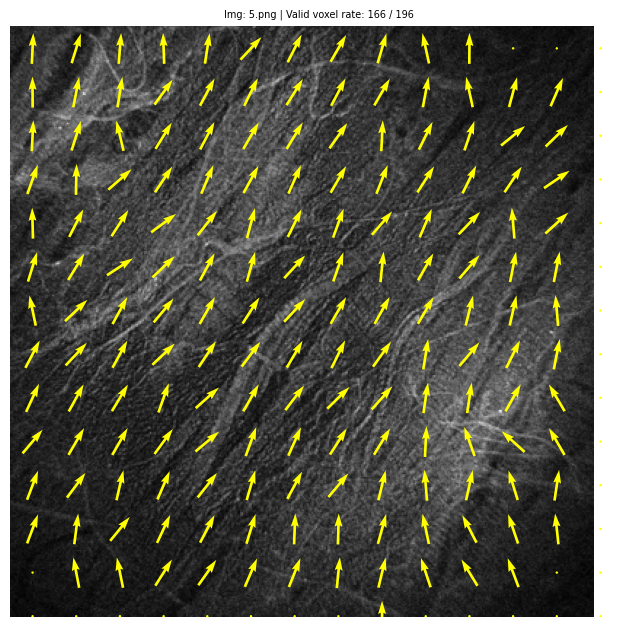

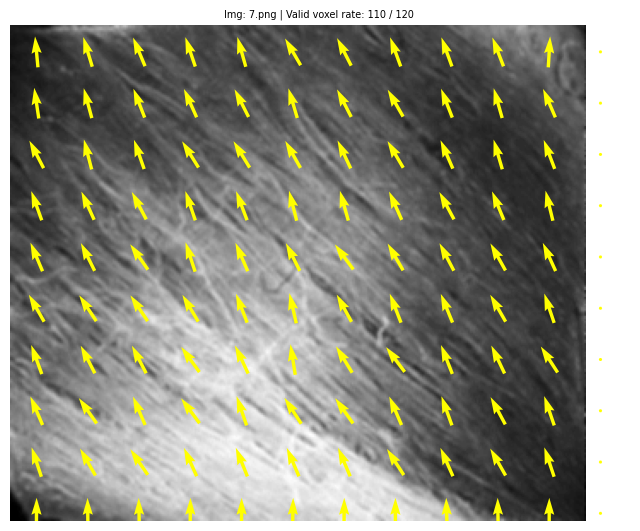

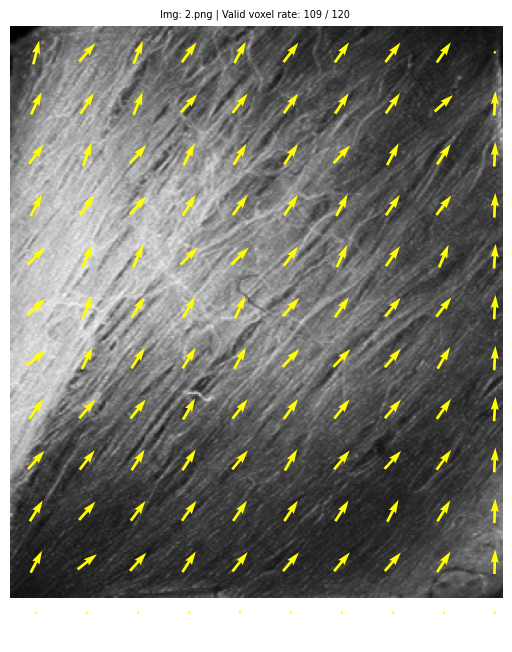

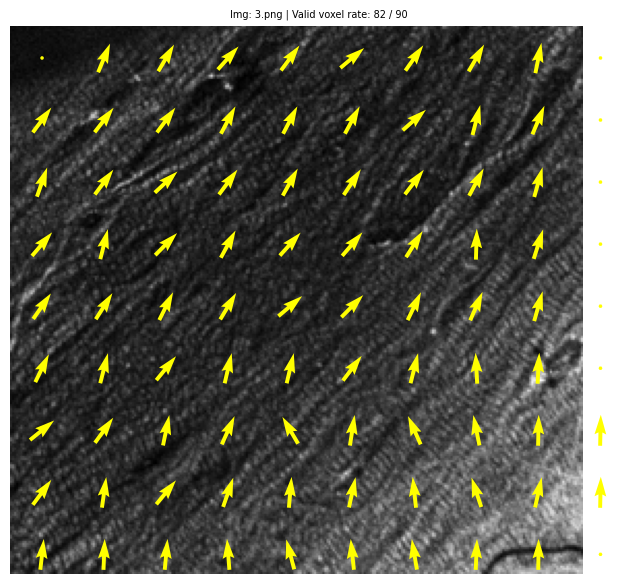

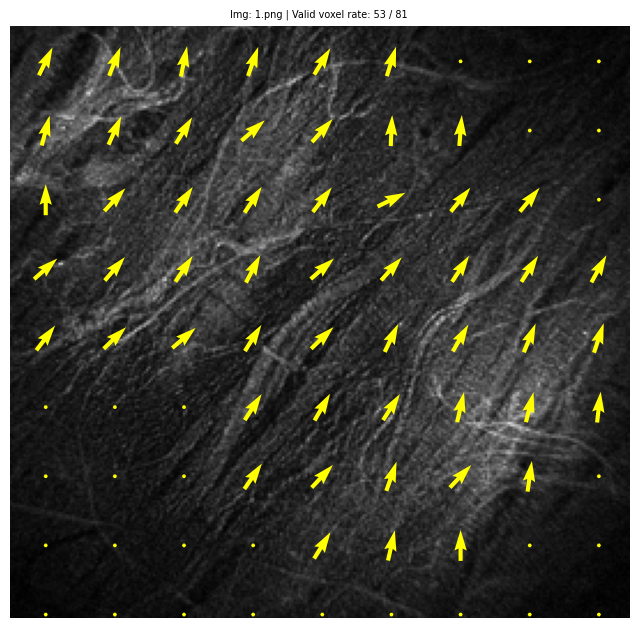

In [23]:
VOXEL_SIZE = 30

file_dir = "../images/por_image/"
file_list = [file for file in os.listdir(file_dir) if file.endswith(".png")]

for img_name in file_list:
    img_dir = os.path.join(file_dir, img_name)
    image = get_img(img_dir)
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)
    plot_map(image, img_name, x, y, u, v, counts, scale=20)


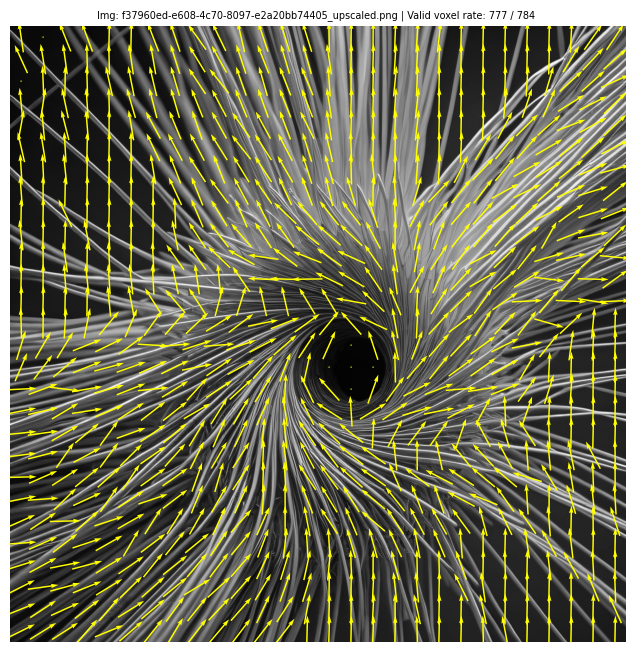

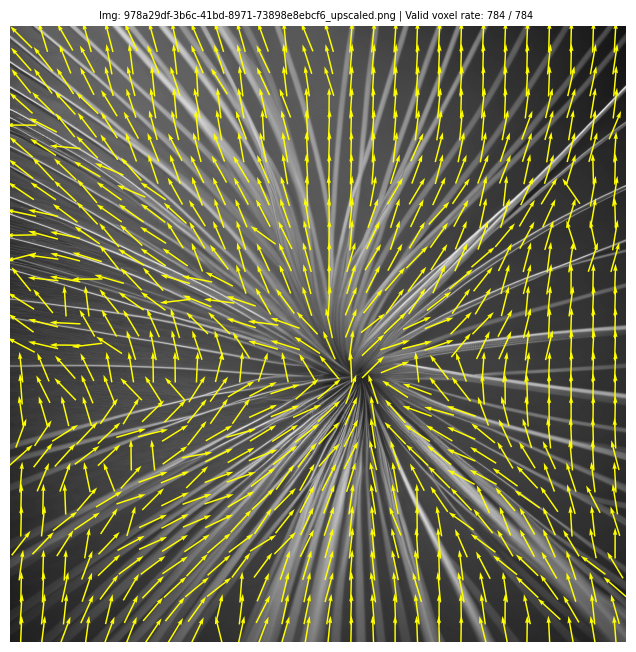

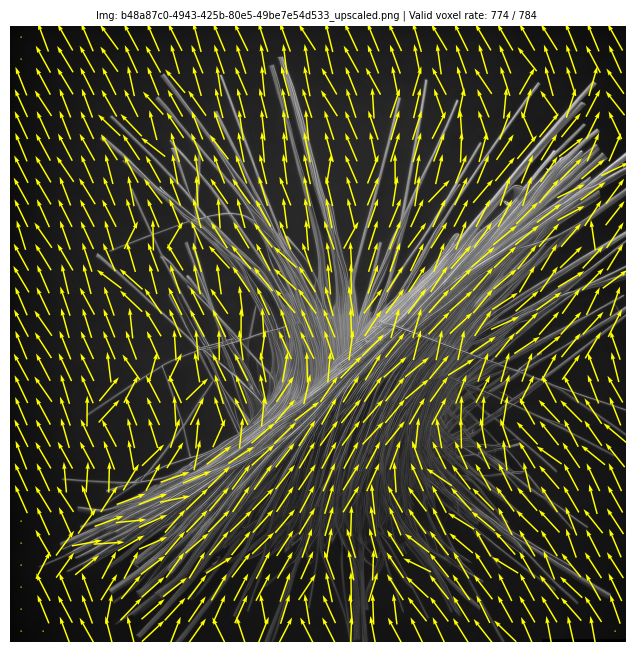

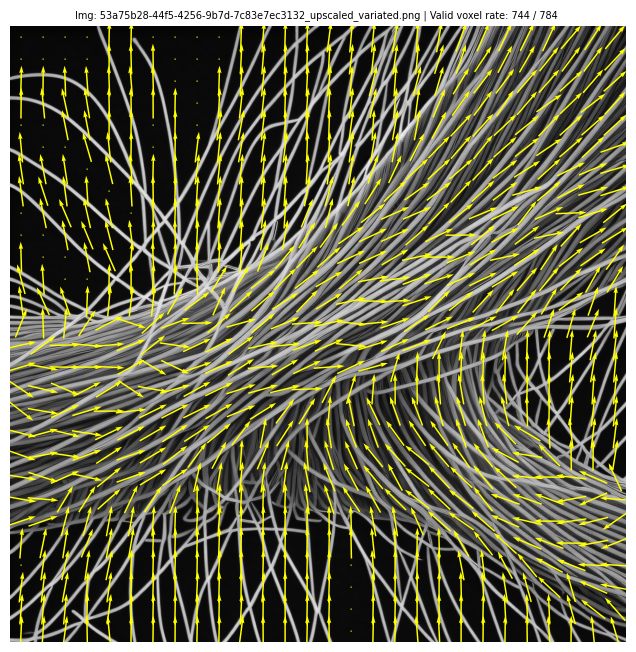

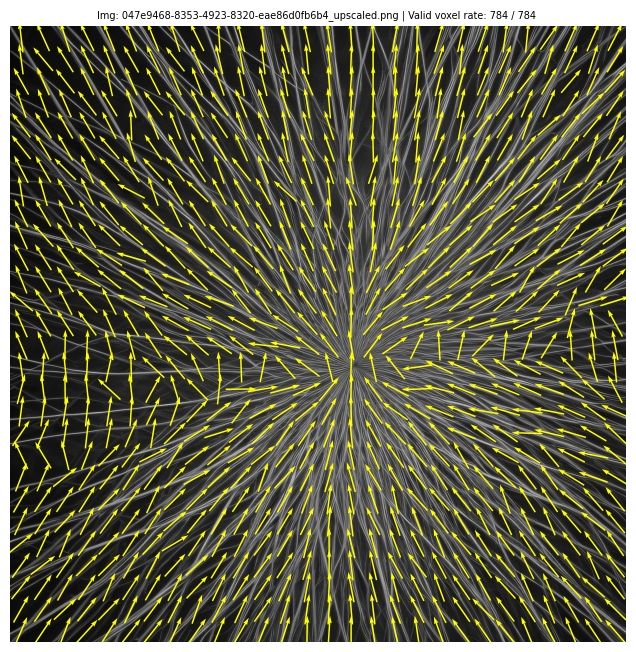

...

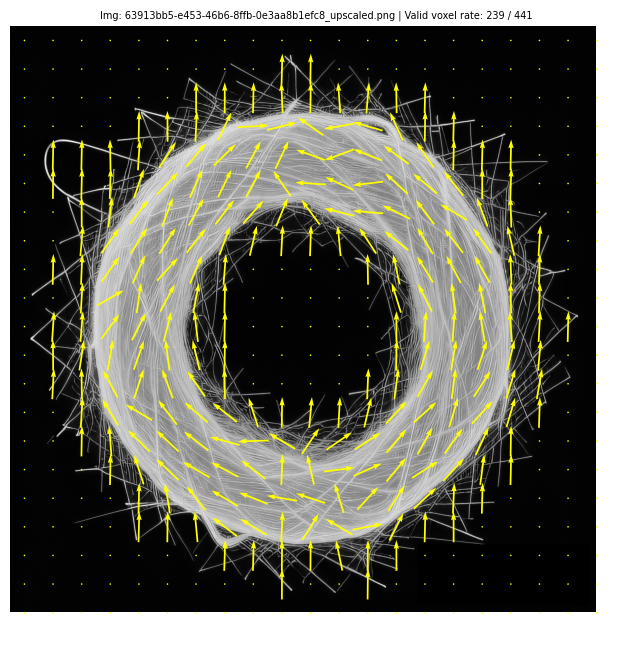

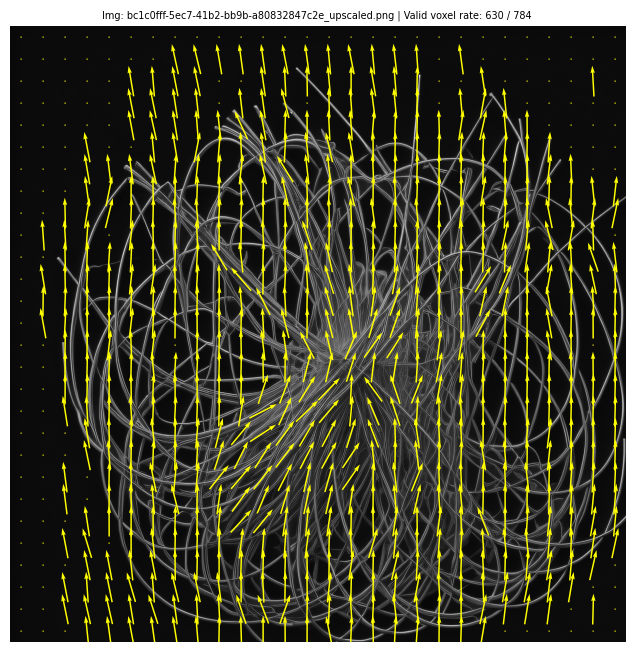

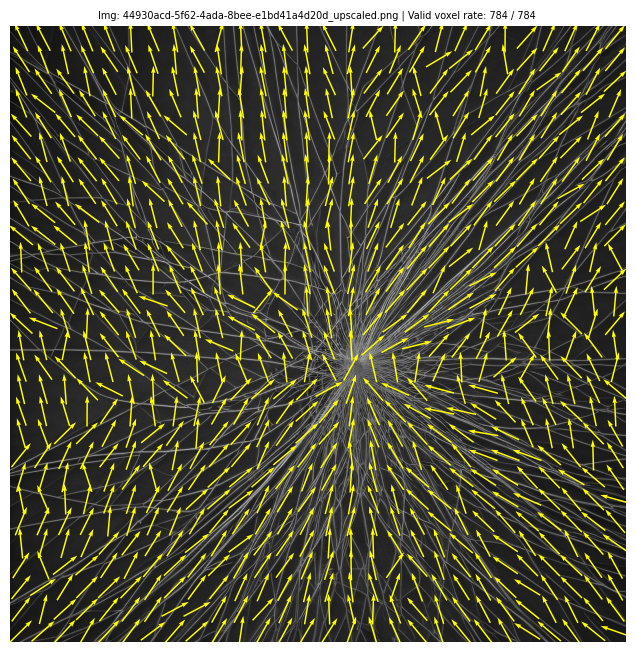

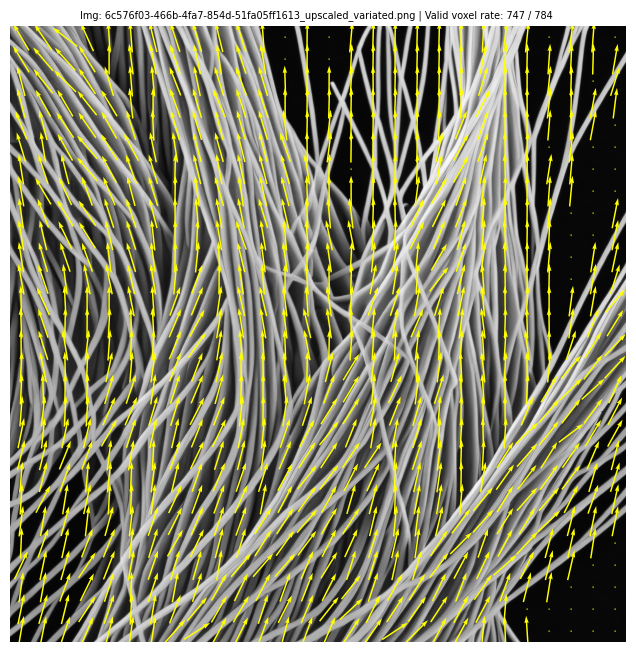

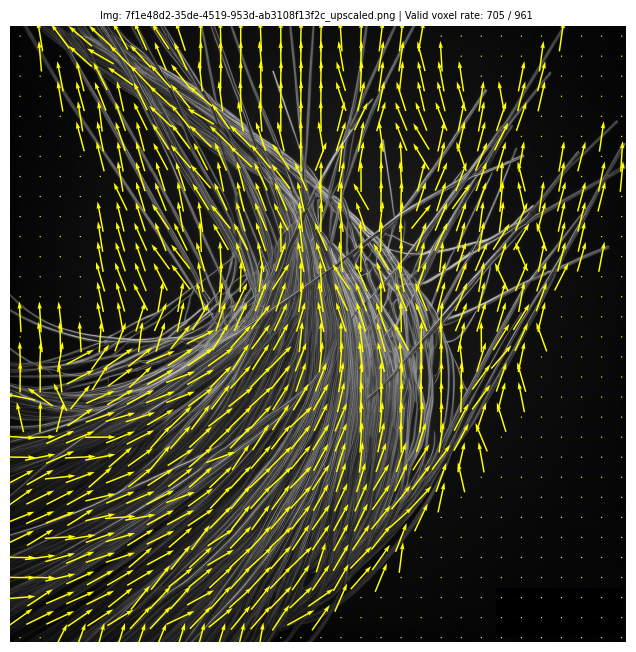

In [25]:
VOXEL_SIZE = 100

file_dir = "../images/diffusion/Big/"
file_list = [file for file in os.listdir(file_dir) if file.endswith(".png")]

for img_name in file_list:
    img_dir = os.path.join(file_dir, img_name)
    image = get_img(img_dir)
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)
    plot_map(image, img_name, x, y, u, v, counts, scale=20)



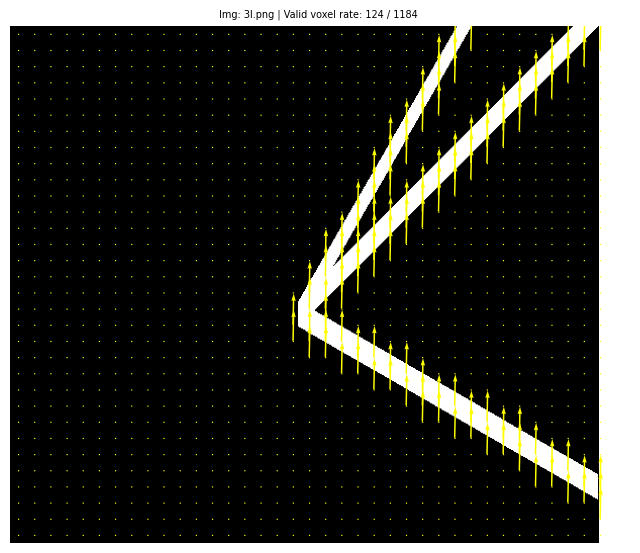

In [26]:
VOXEL_SIZE = 16

file_dir = "../images/test_samples/"
file_list = [file for file in os.listdir(file_dir) if file.endswith(".png")]

for img_name in file_list:
    img_dir = os.path.join(file_dir, img_name)
    image = get_img(img_dir)
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)
    plot_map(image, img_name, x, y, u, v, counts, scale=20)


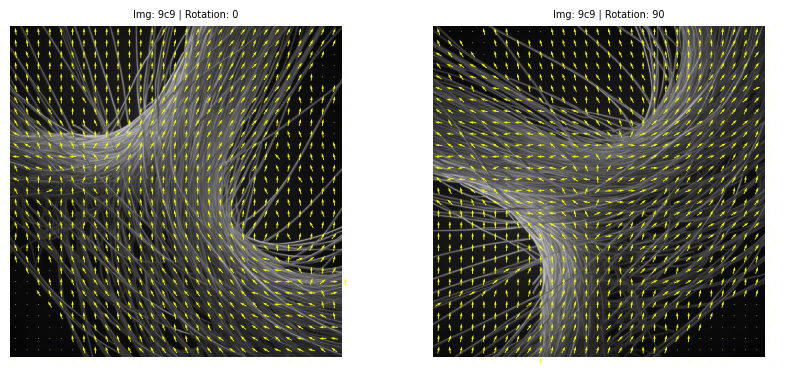

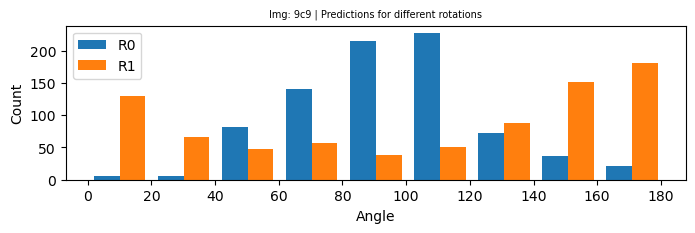

In [ ]:
VOXEL_SIZE= 48
VOXEL_SIZE= 96
file_dir= "../images/diffusion/Big/"
file_list= ["63913bb5-e453-46b6-8ffb-0e3aa8b1efc8_upscaled.png", "f37960ed-e608-4c70-8097-e2a20bb74405_upscaled.png"]
file_list= [file for file in os.listdir(file_dir) if file.endswith(".png")]
file_list= [file for file in os.listdir(file_dir) if file.endswith(".png")][6:7]

for img_name in file_list:
    img_dir= file_dir + img_name
    image = get_img(img_dir)
    angle_array = []
    no_rotatation = 4
    fig, axs = plt.subplots(1, no_rotatation, figsize=(10, 8))
    for i in range(no_rotatation):
        rot_image = image.rotate(90*i)
        voxel_list, pos_list = slice_image(rot_image, VOXEL_SIZE)
        x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)

        filtered_angle_list = [((180 * angle / np.pi) + 90 * i) % 180 for angle in angle_list if angle != None]
        angle_array.append(filtered_angle_list)
        
        plt.subplot(1, no_rotatation, i+1)
        plt.imshow(rot_image, cmap="gray")
        plt.quiver(x, y, u, v, color="yellow", pivot="middle")
        
        plt.axis("off")
        plt.title(f"Img: {img_name[:3]} | Rotation: {90*i}", fontsize= 7)
    
    plt.figure(figsize=(8,2))
    plt.hist(angle_array, bins=9, range=(0, 181), align="mid")
    plt.xticks(np.arange(0, 181, 20))
    plt.legend([f"R{ix}" for ix in range(no_rotatation)])
    plt.xlabel("Angle")
    plt.ylabel("Count")
    plt.title(f"Img: {img_name[:3]} | Predictions for different rotations", fontsize= 7)


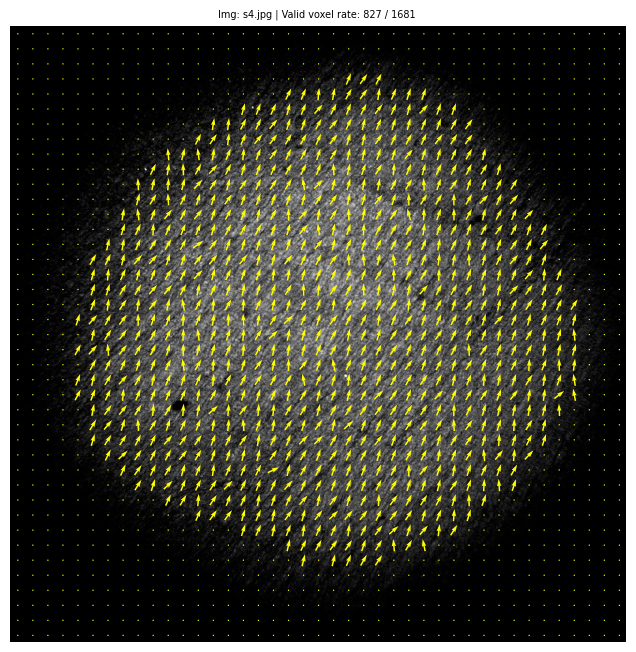

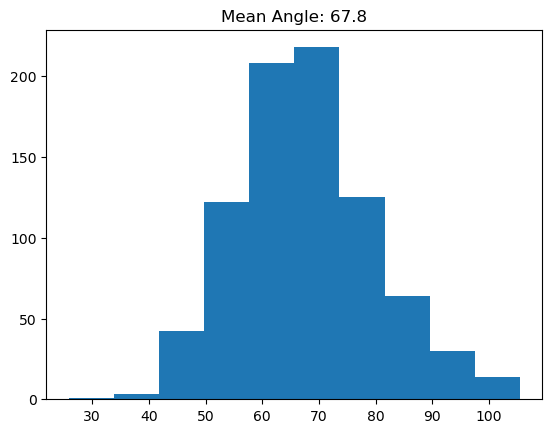

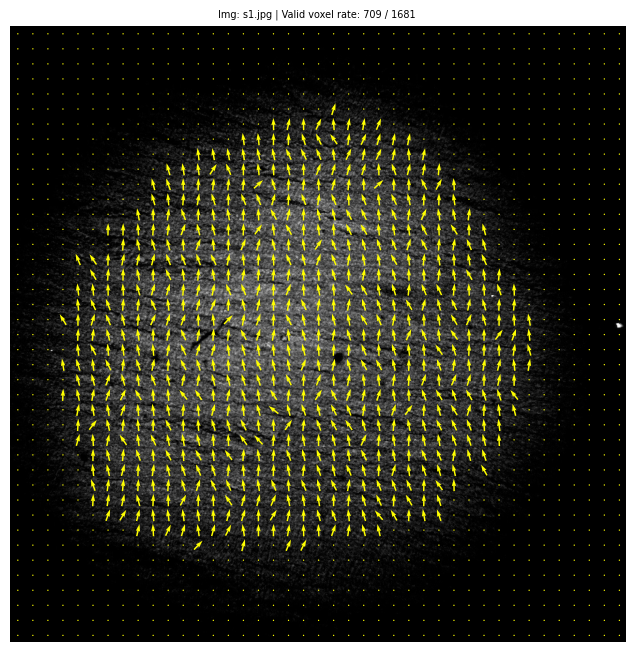

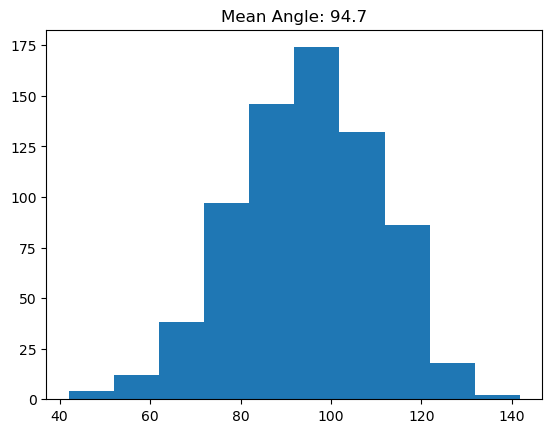

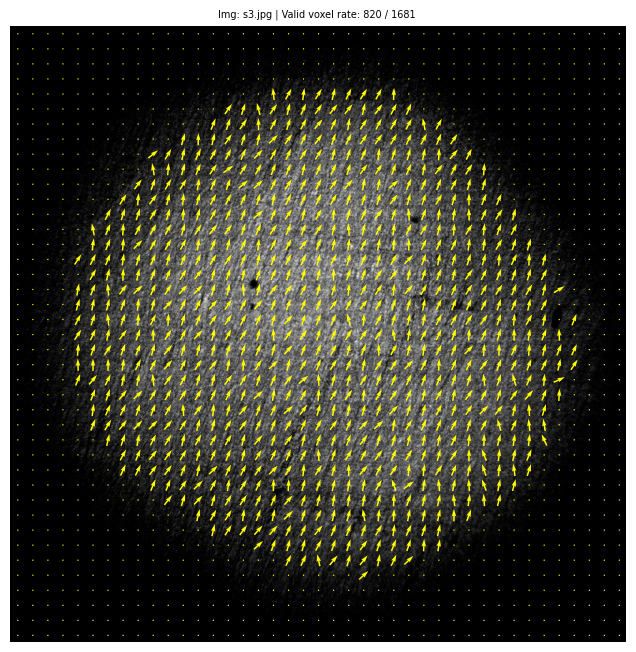

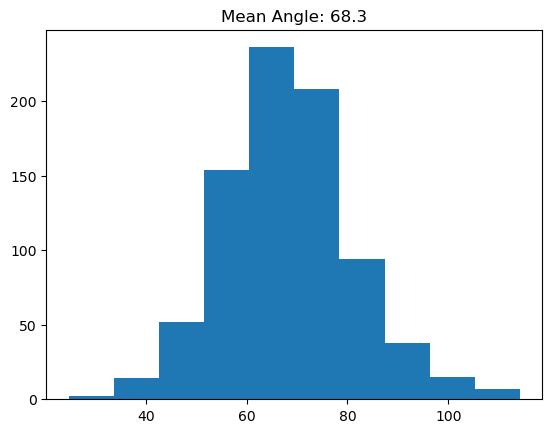

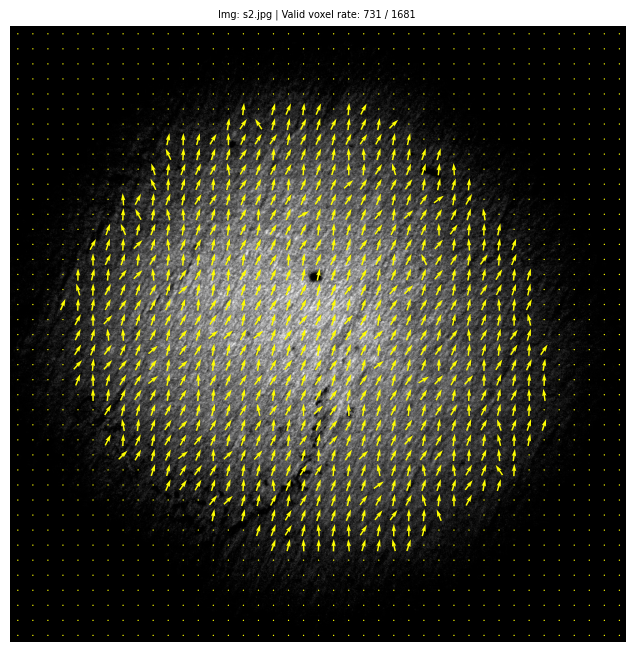

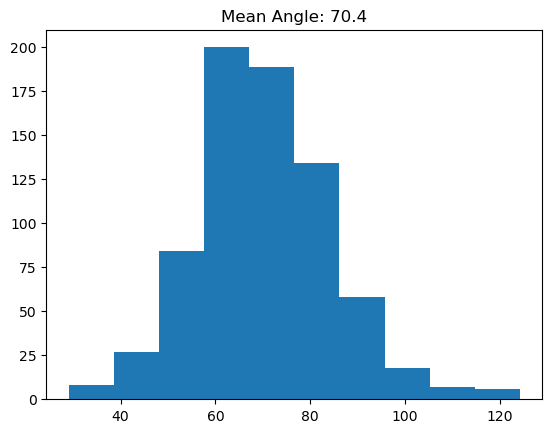

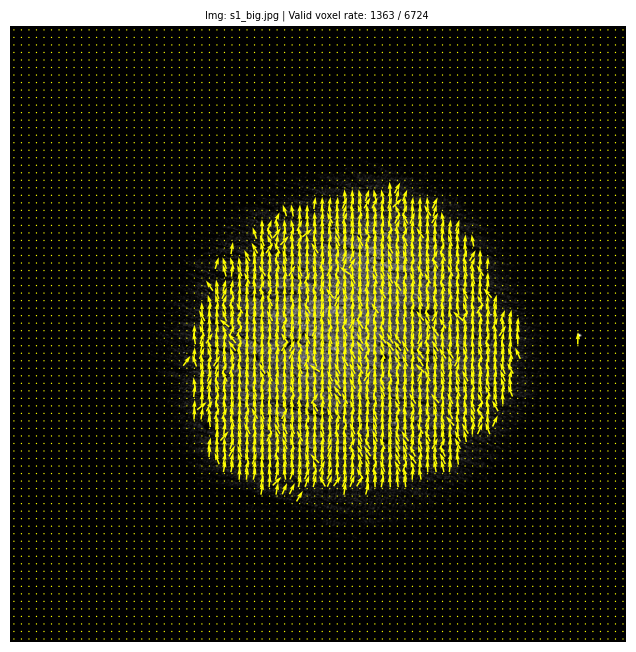

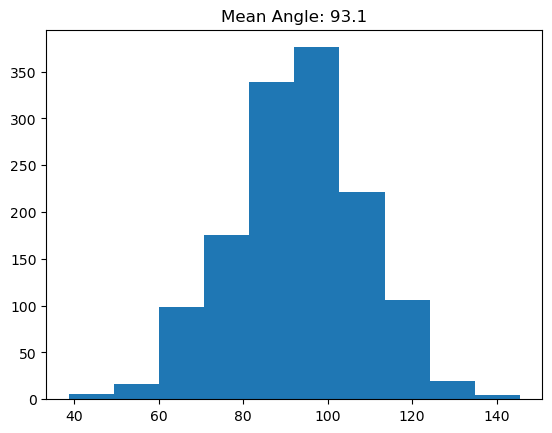

In [27]:
VOXEL_SIZE= 25
file_dir= "../images/porcine_pericardium/sample_1/"
file_dir= "../images/porcine_pericardium/"
file_list= [file for file in os.listdir(file_dir) if file.endswith(".jpg")]

for img_name in file_list:
    img_dir= file_dir + img_name
    image = get_img(img_dir)
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)
    plot_map(image, img_name, x, y, u, v, counts, scale=50)

    plt.figure()
    angles = [a*180/np.pi for a in angle_list if a != None]
    plt.hist(angles)
    plt.title(f"Mean Angle: {np.array(angles).mean():.1f}")

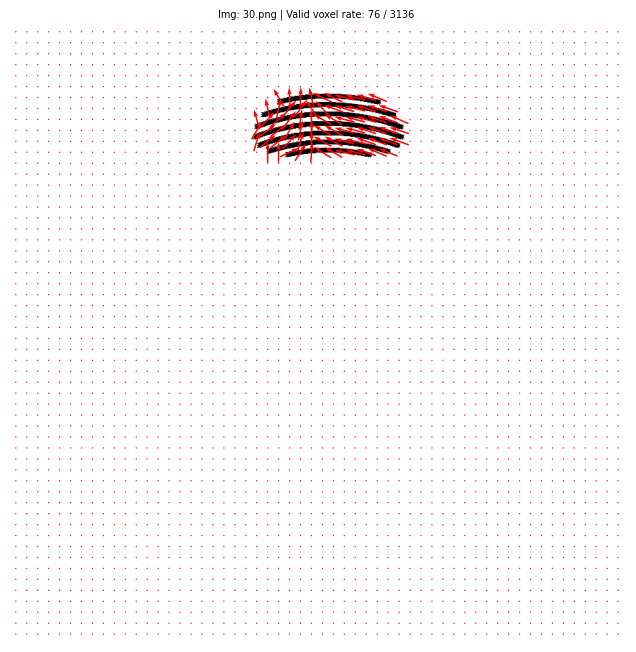

In [8]:
VOXEL_SIZE= 16
file_dir= "images/test_samples/XY/"
file_list= [file for file in os.listdir(file_dir) if file.endswith(".png")][19:20]

for img_name in file_list:
    img_dir= file_dir + img_name
    image = get_img(img_dir)
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    x, y, u, v, angle_list, counts = get_orientation_map(voxel_list, pos_list, VOXEL_SIZE)
    plot_map(image, img_name, x, y, u, v, counts, "red", scale=30)
